# 1. Import libraries and data

In [1]:
import pandas as pd
import numpy as np
import warnings

import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

import scipy.stats as stats
from scipy.stats import chi2_contingency
from ydata_profiling import ProfileReport

from sklearn.preprocessing import MinMaxScaler
from imblearn.over_sampling import SMOTE
from imblearn.under_sampling import TomekLinks

from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import classification_report
from sklearn.metrics import cohen_kappa_score 

pd.set_option('display.max_columns', None)
warnings.filterwarnings('ignore')

In [2]:
data = pd.read_csv('creditcardmarketing.csv', header = None)
data

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16
0,1,No,Air Miles,Letter,High,1,No,High,2,1,4,No,1160.75,1669.0,877.0,1095.0,1002.0
1,2,No,Air Miles,Letter,Medium,1,No,Medium,2,2,5,Yes,147.25,39.0,106.0,78.0,366.0
2,3,No,Air Miles,Postcard,High,2,No,Medium,2,1,2,Yes,276.50,367.0,352.0,145.0,242.0
3,4,No,Air Miles,Letter,Medium,2,No,High,1,1,4,No,1219.00,1578.0,1760.0,1119.0,419.0
4,5,No,Air Miles,Letter,Medium,1,No,Medium,2,1,6,Yes,1211.00,2140.0,1357.0,982.0,365.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17995,17996,No,Cash Back,Letter,High,1,No,Low,1,1,5,Yes,167.50,136.0,65.0,71.0,398.0
17996,17997,No,Cash Back,Letter,High,1,No,Low,3,1,3,Yes,850.50,984.0,940.0,943.0,535.0
17997,17998,No,Cash Back,Letter,High,1,No,Low,2,1,4,No,1087.25,918.0,767.0,1170.0,1494.0
17998,17999,No,Cash Back,Letter,Medium,1,No,Medium,4,2,2,Yes,1022.25,626.0,983.0,865.0,1615.0


In [3]:
# Assign names to the columns since the original csv did not have a header

data.columns = ["customer_number", "offer_accepted", "reward", "mailer_type", "income_level", 
           "bank_accounts_open", "overdraft_protection", "credit_rating", "credit_cards_held", "homes_owned",
          "household_size", "own_your_home", "average_balance", "balance_q1", "balance_q2", "balance_q3", "balance_q4"]

data.head()

,customer_number,offer_accepted,reward,mailer_type,income_level,bank_accounts_open,overdraft_protection,credit_rating,credit_cards_held,homes_owned,household_size,own_your_home,average_balance,balance_q1,balance_q2,balance_q3,balance_q4
0,1,No,Air Miles,Letter,High,1,No,High,2,1,4,No,1160.75,1669.0,877.0,1095.0,1002.0
1,2,No,Air Miles,Letter,Medium,1,No,Medium,2,2,5,Yes,147.25,39.0,106.0,78.0,366.0
2,3,No,Air Miles,Postcard,High,2,No,Medium,2,1,2,Yes,276.50,367.0,352.0,145.0,242.0
3,4,No,Air Miles,Letter,Medium,2,No,High,1,1,4,No,1219.00,1578.0,1760.0,1119.0,419.0
4,5,No,Air Miles,Letter,Medium,1,No,Medium,2,1,6,Yes,1211.00,2140.0,1357.0,982.0,365.0


# 2. Exporting SQL files

In [4]:
data.to_csv("sqldf.csv")

In [5]:
null_data = data[data.isna().any(axis = 1)]
null_data

,customer_number,offer_accepted,reward,mailer_type,income_level,bank_accounts_open,overdraft_protection,credit_rating,credit_cards_held,homes_owned,household_size,own_your_home,average_balance,balance_q1,balance_q2,balance_q3,balance_q4
323,324,No,Points,Postcard,Medium,1,No,High,1,1,4,No,NaN,NaN,NaN,NaN,NaN
3070,3071,Yes,Air Miles,Postcard,Low,3,No,Medium,2,1,4,Yes,NaN,NaN,NaN,NaN,NaN
3108,3109,No,Air Miles,Letter,Low,1,No,High,3,1,4,Yes,NaN,NaN,NaN,NaN,NaN
3789,3790,No,Air Miles,Letter,Medium,2,No,High,3,1,3,No,NaN,NaN,NaN,NaN,NaN
5083,5084,No,Points,Letter,Medium,1,No,High,1,1,3,Yes,NaN,NaN,NaN,NaN,NaN
5677,5678,No,Air Miles,Postcard,Low,1,No,Low,2,1,4,Yes,NaN,NaN,NaN,NaN,NaN
5689,5690,No,Air Miles,Postcard,Medium,1,No,Medium,3,1,5,No,NaN,NaN,NaN,NaN,NaN
6932,6933,No,Air Miles,Postcard,Medium,1,No,Medium,2,2,4,Yes,NaN,NaN,NaN,NaN,NaN
7787,7788,No,Air Miles,Letter,Low,2,No,Low,1,1,4,Yes,NaN,NaN,NaN,NaN,NaN
7864,7865,No,Cash Back,Postcard,High,2,Yes,Low,2,1,3,No,NaN,NaN,NaN,NaN,NaN


In [6]:
null_data.to_csv('null_data.csv')

# 2. Cleaning/EDA

In [7]:
# Drop customer_number due to high cardinality

data = data.drop(['customer_number'], axis = 1)

In [8]:
# Check the column types 

data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 18000 entries, 0 to 17999
Data columns (total 16 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   offer_accepted        18000 non-null  object 
 1   reward                18000 non-null  object 
 2   mailer_type           18000 non-null  object 
 3   income_level          18000 non-null  object 
 4   bank_accounts_open    18000 non-null  int64  
 5   overdraft_protection  18000 non-null  object 
 6   credit_rating         18000 non-null  object 
 7   credit_cards_held     18000 non-null  int64  
 8   homes_owned           18000 non-null  int64  
 9   household_size        18000 non-null  int64  
 10  own_your_home         18000 non-null  object 
 11  average_balance       17976 non-null  float64
 12  balance_q1            17976 non-null  float64
 13  balance_q2            17976 non-null  float64
 14  balance_q3            17976 non-null  float64
 15  balance_q4         

- The column types correspond to what was expected. 
- There are 7 categorical columns and 9 numerical.

In [9]:
# Check NaNs

data.isna().sum()

offer_accepted           0
reward                   0
mailer_type              0
income_level             0
bank_accounts_open       0
overdraft_protection     0
credit_rating            0
credit_cards_held        0
homes_owned              0
household_size           0
own_your_home            0
average_balance         24
balance_q1              24
balance_q2              24
balance_q3              24
balance_q4              24
dtype: int64

In [10]:
data.shape

(18000, 16)

In [11]:
24/18000

0.0013333333333333333

In [12]:
# There are 24 rows with NaNs
# Since they represent only the 0.1% of the dataframe, we drop them

data = data.dropna()
data.shape

(17976, 16)

In [13]:
data.isna().sum()

offer_accepted          0
reward                  0
mailer_type             0
income_level            0
bank_accounts_open      0
overdraft_protection    0
credit_rating           0
credit_cards_held       0
homes_owned             0
household_size          0
own_your_home           0
average_balance         0
balance_q1              0
balance_q2              0
balance_q3              0
balance_q4              0
dtype: int64

In [14]:
# Descriptive statistics of the numerical variables

data.describe()

,bank_accounts_open,credit_cards_held,homes_owned,household_size,average_balance,balance_q1,balance_q2,balance_q3,balance_q4
count,17976.000000,17976.000000,17976.000000,17976.000000,17976.000000,17976.000000,17976.000000,17976.000000,17976.000000
mean,1.255730,1.903427,1.203549,3.499110,940.515562,910.450656,999.392190,1042.033600,810.185803
std,0.472405,0.797086,0.427446,1.114476,350.297837,620.077060,457.402268,553.452599,559.001365
min,1.000000,1.000000,1.000000,1.000000,48.250000,0.000000,0.000000,0.000000,0.000000
25%,1.000000,1.000000,1.000000,3.000000,787.500000,392.750000,663.000000,633.000000,363.000000
50%,1.000000,2.000000,1.000000,3.000000,1007.000000,772.000000,1032.000000,945.500000,703.000000
75%,1.000000,2.000000,1.000000,4.000000,1153.250000,1521.000000,1342.000000,1463.000000,1212.000000
max,3.000000,4.000000,3.000000,9.000000,3366.250000,3450.000000,3421.000000,3823.000000,4215.000000


Some comments:
- Most customers have 1 account and 2 credit cards.
- The variable homes_owned has a minimum of 1 (what about customers that don't own a house?). Check if this corresponds with the variable "own_your_home".
- The mean houshold has 3.5 members.
- The average balance is higher in Q3.
- Some customers have 0 balance in one or more quarter. Check those customers in case there is an error.

In [15]:
data[data['balance_q1'] == 0]

,offer_accepted,reward,mailer_type,income_level,bank_accounts_open,overdraft_protection,credit_rating,credit_cards_held,homes_owned,household_size,own_your_home,average_balance,balance_q1,balance_q2,balance_q3,balance_q4
5557,No,Air Miles,Letter,Low,1,No,High,1,1,5,Yes,1086.50,0.0,1621.0,1542.0,1183.0
10829,No,Cash Back,Postcard,High,1,No,Low,1,1,4,Yes,174.25,0.0,465.0,23.0,209.0
11246,No,Points,Postcard,Medium,1,Yes,Medium,3,1,3,Yes,207.25,0.0,425.0,135.0,269.0
14828,No,Points,Postcard,Medium,1,No,Medium,2,1,2,Yes,166.00,0.0,32.0,499.0,133.0
17140,No,Points,Letter,Medium,1,No,Low,2,1,4,Yes,241.50,0.0,182.0,348.0,436.0


In [16]:
data[data['balance_q2'] == 0]

,offer_accepted,reward,mailer_type,income_level,bank_accounts_open,overdraft_protection,credit_rating,credit_cards_held,homes_owned,household_size,own_your_home,average_balance,balance_q1,balance_q2,balance_q3,balance_q4
11276,No,Points,Postcard,Medium,1,No,High,1,1,5,No,63.5,72.0,0.0,45.0,137.0


In [17]:
data[data['balance_q3'] == 0]

,offer_accepted,reward,mailer_type,income_level,bank_accounts_open,overdraft_protection,credit_rating,credit_cards_held,homes_owned,household_size,own_your_home,average_balance,balance_q1,balance_q2,balance_q3,balance_q4
11399,No,Cash Back,Postcard,High,3,Yes,Low,2,1,2,Yes,290.5,286.0,457.0,0.0,419.0


In [18]:
data[data['balance_q4'] == 0]

,offer_accepted,reward,mailer_type,income_level,bank_accounts_open,overdraft_protection,credit_rating,credit_cards_held,homes_owned,household_size,own_your_home,average_balance,balance_q1,balance_q2,balance_q3,balance_q4
319,No,Points,Letter,Low,1,No,Medium,2,1,4,Yes,287.25,265.0,409.0,475.0,0.0
3310,No,Points,Letter,High,1,No,Medium,2,1,3,No,124.25,235.0,238.0,24.0,0.0
5421,No,Cash Back,Letter,High,1,No,Medium,2,2,5,Yes,169.50,409.0,223.0,46.0,0.0
9008,No,Cash Back,Letter,Low,1,No,Low,1,1,3,No,996.00,1969.0,1066.0,949.0,0.0
16769,No,Points,Letter,Medium,1,No,High,2,1,5,No,217.00,472.0,260.0,136.0,0.0


These customers had 0 balance in one of the quarters of last year, but this doesn't look as an error.

### Visualizations to check distributions and unique values of each column

In [19]:
# Target

px.histogram(data, x='offer_accepted', color = "offer_accepted", 
             color_discrete_map = {'No':'#1f77b4','Yes':'rgb(255, 127, 14)'},
             labels = {"offer_accepted": "Offer accepted"})

In [20]:
for i in px.colors.DEFAULT_PLOTLY_COLORS:
    print(i)

rgb(31, 119, 180)
rgb(255, 127, 14)
rgb(44, 160, 44)
rgb(214, 39, 40)
rgb(148, 103, 189)
rgb(140, 86, 75)
rgb(227, 119, 194)
rgb(127, 127, 127)
rgb(188, 189, 34)
rgb(23, 190, 207)


**Here we have imbalanced data in our target and we should deal with that. But it can be seen that the number of 'NO's are much higher than 'Yes'.**

In [21]:
# Independent variables: categorical 

categoricals = data.select_dtypes(object).drop("offer_accepted", axis=1)

for col in categoricals.columns:
    fig = px.histogram(data, x=col)
    fig.show()

**Based on the barplots for categorical columns, it can be seen that none of the categories have too many values. So, they can be used for encoding. Also, most of them are either boolean (Yes/No) or ordinal. We will only have to use one hot encoding in reward and in mailer_type**

In [22]:
# Independent variables: numerical discrete 

discrete = data.select_dtypes(int)

for col in discrete.columns:
    fig = px.histogram(data, x=col)
    fig.update_layout(bargap=0.2) # add space between bars
    fig.show()

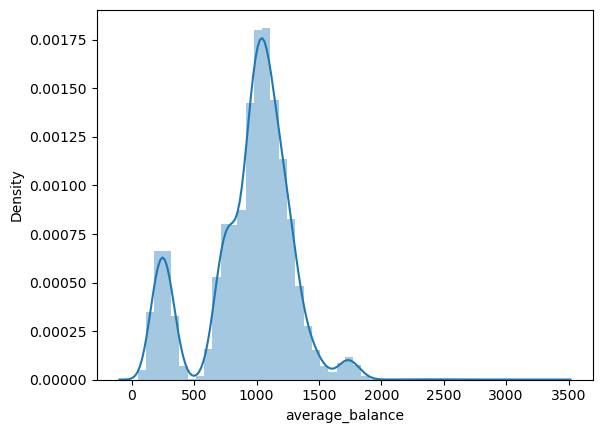

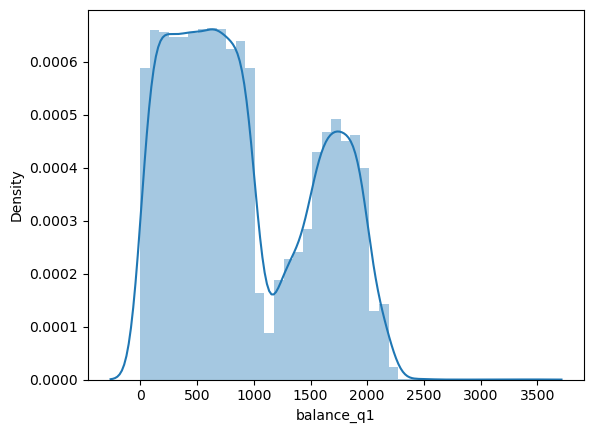

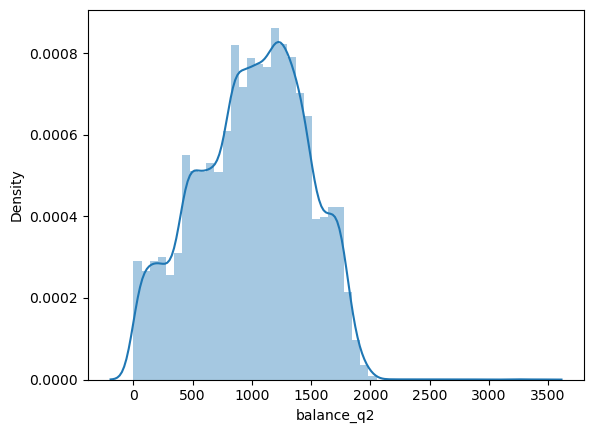

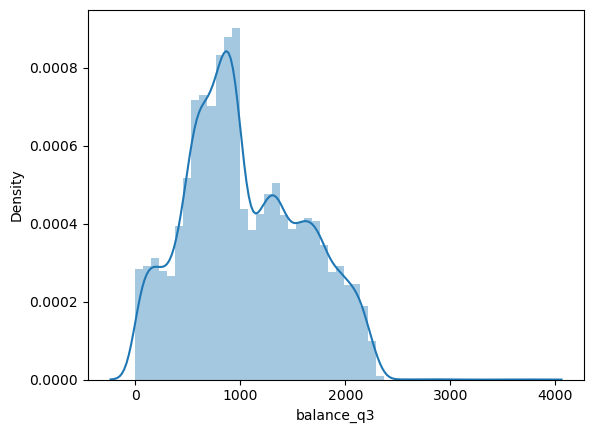

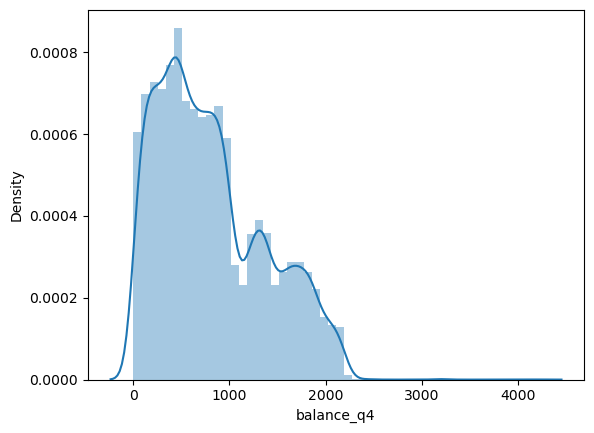

In [23]:
# Independent variables: numerical continuous 

continuous = data.select_dtypes(float)

for col in continuous.columns:
    sns.distplot(continuous[col])
    plt.show()

In [24]:
# Plot of the distribution of average balance for the presentation 

px.histogram(data, "average_balance", 
             labels = {"average_balance": "Average balance"}, 
             width = 800, height = 600)

In [25]:
# Plot of the distribution of income level for the presentation 

fig = px.pie(data, "income_level", title = "Income level", width = 500, height = 400)
fig.update_traces(textposition='inside', textinfo='percent+label')
fig.show()

Comments:
- offer_accepted: the target is very imbalanced.
- reward, mailer_type: uniform distribution.
- income_level: medium is the most common category, as would be expected. 
- bank_accounts_open: most customers have only one.
- overdraft_protection: vast majority of no's.
- credit_rating: uniform distribution.
- own_your_home: majority of yes but there are more than 6000 customers that don't own their home. This does't correspond with "homes_owned".
- bank_accounts_open: majority of 1.
- credit_cards_held: majority of 2 but also 1 is quite common. There are no customers that don't own a credit card.
- homes_owned: majority of 1. 14,500 customers answered they own a home vs 11,600 that answered "yes" when asked if they owned their home. Consider what to do with these two columns.
- household_size: bell shaped distribution, with the most common being 3 and 4.
- The continuous variables are not normally distributed, however, it looks like balance q2&3&4 have a closer distribution to normal.
- Nevertheless, logistic regression does not assume a normal distribution of the error terms (residuals), so this is not a problem. In any case, we should try to apply transformations and see how it affects the model.

### Outliers in numerical continuous

In [26]:
# Using box plot to show the outliers:

for col in continuous.columns:
    fig = px.box(data, x=col)
    fig.show()

Average balance has a considerable number of outliers, while the quarters balances have much less (looks like less than 10), and they are all above the upper fence. Let's have a look at those.

In [27]:
# Checking the outliers for balance_q1,q2,q3,q4 by filtering the ones higher than upper fence

quarter_outliers = data.index[data['balance_q1'] >2509].tolist()

for customer in data.index[data['balance_q2'] >2351].tolist():
    quarter_outliers.append(customer)

for customer in data.index[data['balance_q3'] >2576].tolist():
    quarter_outliers.append(customer)
    
for customer in data.index[data['balance_q4'] >2475].tolist():
    quarter_outliers.append(customer)
    
quarter_outliers = list(dict.fromkeys(quarter_outliers)) # removes duplicates because dictionaries can't have duplicate keys
quarter_outliers

[12635, 2296, 8887, 10576, 15259, 14003, 15608, 2655, 8777, 12633]

In [28]:
len(quarter_outliers)

10

In [29]:
data[data.index.isin(quarter_outliers)] # Showing the outliers in a dataframe

,offer_accepted,reward,mailer_type,income_level,bank_accounts_open,overdraft_protection,credit_rating,credit_cards_held,homes_owned,household_size,own_your_home,average_balance,balance_q1,balance_q2,balance_q3,balance_q4
2296,No,Air Miles,Letter,High,1,No,Medium,2,2,2,No,3366.25,2509.0,2918.0,3823.0,4215.0
2655,No,Points,Letter,Medium,1,Yes,Low,2,1,5,No,2336.75,1638.0,2351.0,2180.0,3178.0
8777,No,Cash Back,Postcard,Medium,1,No,High,1,1,2,No,2073.25,1490.0,1704.0,1898.0,3201.0
8887,No,Cash Back,Letter,Medium,1,No,Medium,2,1,2,Yes,2738.50,2453.0,3240.0,3016.0,2245.0
10576,No,Points,Letter,Medium,3,No,High,1,1,2,Yes,2609.50,2310.0,3421.0,2802.0,1905.0
12633,No,Cash Back,Letter,Medium,1,No,Medium,3,1,3,Yes,1182.00,179.0,217.0,1114.0,3218.0
12635,No,Air Miles,Letter,High,1,No,High,3,2,4,No,2948.50,3450.0,3214.0,2750.0,2380.0
14003,No,Cash Back,Letter,Medium,1,No,Medium,1,1,1,Yes,2437.50,2250.0,2134.0,2945.0,2421.0
15259,No,Air Miles,Letter,Medium,1,No,High,2,1,3,No,2320.50,2502.0,2445.0,2012.0,2323.0
15608,No,Points,Postcard,High,1,No,Low,1,1,4,Yes,2271.50,1666.0,1468.0,2761.0,3191.0


We have 10 customers that are outliers in one or more of the quarters balances columns. Now let's check if these customers are also outliers in the average_balance column:

In [30]:
# Checking the outliers in average_balance

average_outliers_upper = data.index[data['average_balance'] >1700.75].tolist()
len(average_outliers_upper)

278

In [31]:
quarter_outliers_df = data[data.index.isin(quarter_outliers)]
quarter_outliers_df["average_outlier"] = quarter_outliers_df.index.isin(average_outliers_upper)

quarter_outliers_df

,offer_accepted,reward,mailer_type,income_level,bank_accounts_open,overdraft_protection,credit_rating,credit_cards_held,homes_owned,household_size,own_your_home,average_balance,balance_q1,balance_q2,balance_q3,balance_q4,average_outlier
2296,No,Air Miles,Letter,High,1,No,Medium,2,2,2,No,3366.25,2509.0,2918.0,3823.0,4215.0,True
2655,No,Points,Letter,Medium,1,Yes,Low,2,1,5,No,2336.75,1638.0,2351.0,2180.0,3178.0,True
8777,No,Cash Back,Postcard,Medium,1,No,High,1,1,2,No,2073.25,1490.0,1704.0,1898.0,3201.0,True
8887,No,Cash Back,Letter,Medium,1,No,Medium,2,1,2,Yes,2738.50,2453.0,3240.0,3016.0,2245.0,True
10576,No,Points,Letter,Medium,3,No,High,1,1,2,Yes,2609.50,2310.0,3421.0,2802.0,1905.0,True
12633,No,Cash Back,Letter,Medium,1,No,Medium,3,1,3,Yes,1182.00,179.0,217.0,1114.0,3218.0,False
12635,No,Air Miles,Letter,High,1,No,High,3,2,4,No,2948.50,3450.0,3214.0,2750.0,2380.0,True
14003,No,Cash Back,Letter,Medium,1,No,Medium,1,1,1,Yes,2437.50,2250.0,2134.0,2945.0,2421.0,True
15259,No,Air Miles,Letter,Medium,1,No,High,2,1,3,No,2320.50,2502.0,2445.0,2012.0,2323.0,True
15608,No,Points,Postcard,High,1,No,Low,1,1,4,Yes,2271.50,1666.0,1468.0,2761.0,3191.0,True


All are also outliers in the average_balance column with the exception of one:

In [32]:
quarter_outliers_df[quarter_outliers_df['average_outlier']== False]

,offer_accepted,reward,mailer_type,income_level,bank_accounts_open,overdraft_protection,credit_rating,credit_cards_held,homes_owned,household_size,own_your_home,average_balance,balance_q1,balance_q2,balance_q3,balance_q4,average_outlier
12633,No,Cash Back,Letter,Medium,1,No,Medium,3,1,3,Yes,1182.0,179.0,217.0,1114.0,3218.0,False


These 10 columns could be dropped, but for the average_balance we have to consider to drop or not the outliers. How many rows are outliers in this column?

In [33]:
average_outliers_lower = data.index[data['average_balance'] < 239].tolist()
len(average_outliers_lower)

1163

In [34]:
len(average_outliers_upper) + len(average_outliers_lower)

1441

In [35]:
data.shape

(17976, 16)

In [36]:
1441/17976*100 # percentage of the dataframe that are outliers 

8.016243880729862

**The number of deleted rows would be 1441 which is 8% of the whole data.**

### Relationships between variables

In [37]:
numericals = data.select_dtypes(np.number)
categoricals = data.select_dtypes(np.object)

**Checking the relationships between continuous columns and see if they are correlated**

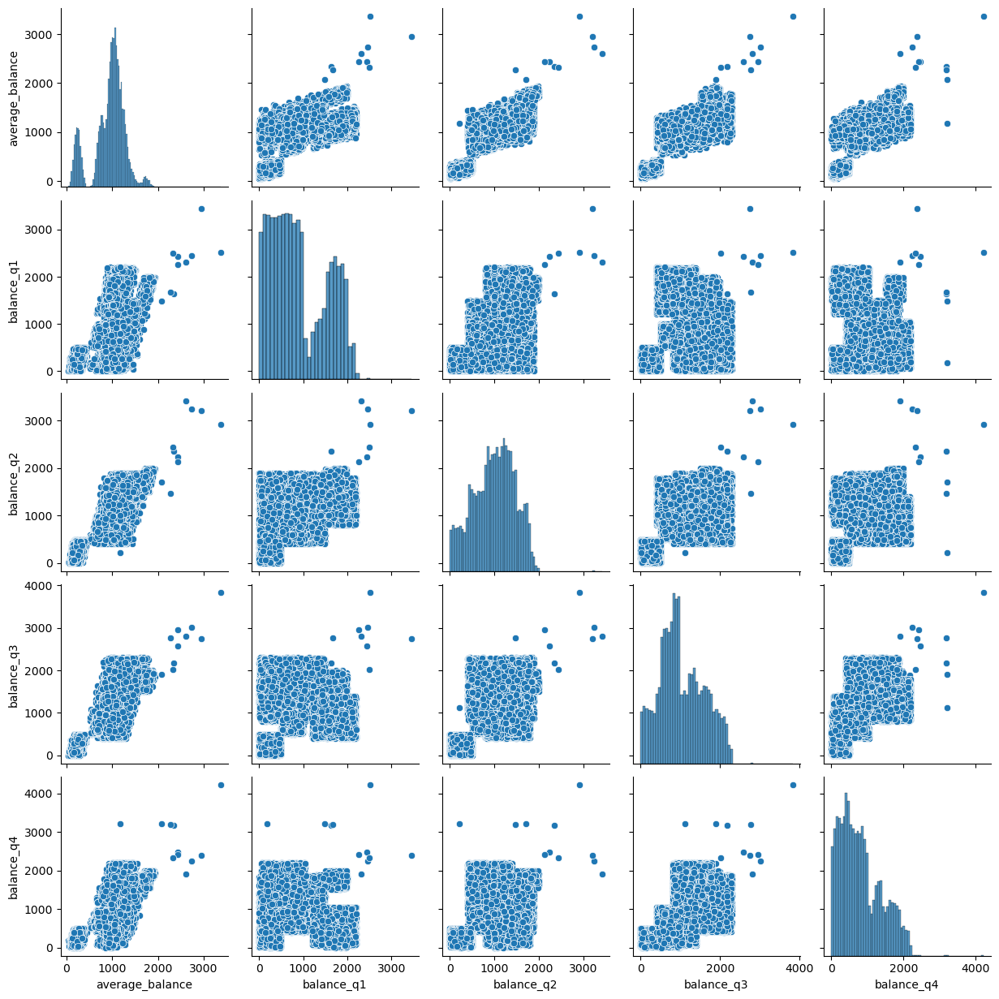

In [38]:
sns.pairplot(continuous)

Looks like there is some correlation between average_balance and the Q1, Q2, Q3 and Q4 balances, which makes sense since average_balance is the average of the other 4 columns.

**Using plots to check relationships within the categorical variables**

In [39]:
for col in categoricals.columns:
    fig = px.histogram(data, x=col, color="offer_accepted")
    fig.show()

This kind of plot is interesting, however it would be better to be able to see the relative frecuency.

In [40]:
# Reward and offer accepted

pct = (categoricals.groupby(["reward", "offer_accepted"]).size() / categoricals.groupby(["reward"]).size()).reset_index().rename({0:'percent'}, axis=1)
px.bar(pct, x="reward", color="offer_accepted", y="percent",
       labels = {"reward" : "Reward", "offer_accepted": "Offer accepted"},
       width=500, height=400)

In [41]:
# Mailer type and offer accepted

pct = (categoricals.groupby(["mailer_type", "offer_accepted"]).size() / categoricals.groupby(["mailer_type"]).size()).reset_index().rename({0:'percent'}, axis=1)
px.bar(pct, x="mailer_type", color="offer_accepted", y="percent",
       labels = {"mailer_type" : "Mailer Type", "offer_accepted": "Offer accepted"},
       width=500, height=400)

In [42]:
# Income level and offer accepted

pct = (categoricals.groupby(["income_level", "offer_accepted"]).size() / categoricals.groupby(["income_level"]).size()).reset_index().rename({0:'percent'}, axis=1)
px.bar(pct, x="income_level", color="offer_accepted", y="percent", 
       labels = {"income_level" : "Income Level", "offer_accepted": "Offer accepted"},
       category_orders = {"income_level": ["Low", "Medium", "High"]},
       width=500, height=400)

In [43]:
# Overdraft protection and offer accepted

pct = (categoricals.groupby(["overdraft_protection", "offer_accepted"]).size() / categoricals.groupby(["overdraft_protection"]).size()).reset_index().rename({0:'percent'}, axis=1)
px.bar(pct, x="overdraft_protection", color="offer_accepted", y="percent")

In [44]:
# Credit rating and offer accepted

pct = (categoricals.groupby(["credit_rating", "offer_accepted"]).size() / categoricals.groupby(["credit_rating"]).size()).reset_index().rename({0:'percent'}, axis=1)
px.bar(pct, x="credit_rating", color="offer_accepted", y="percent", 
       labels = {"credit_rating" : "Credit Rating",  "offer_accepted": "Offer accepted"},
       category_orders = {"credit_rating": ["Low", "Medium", "High"]},
       width=500, height=400)

In [45]:
# Own your home and offer accepted

pct = (categoricals.groupby(["own_your_home", "offer_accepted"]).size() / categoricals.groupby(["own_your_home"]).size()).reset_index().rename({0:'percent'}, axis=1)
px.bar(pct, x="own_your_home", color="offer_accepted", y="percent")

Comments:
- Looks like there was a higher proportion of accepted offers when the reward were air miles, followed by points. The lower proportion of accepted offers was with cash back.
- Higher proportion of Yes when the mailer type was a postcard.
- Higher proportion of Yes when the customer had a low income level.
- No apparent variation with the variable overdraft_protection.
- Higher proportion of Yes when the customer had a low credit rating.
- No apparent variation with the variable own_your_home.

However, we cannot take this apparent relationships as truths, in order to do that we should perform statistic calculations.

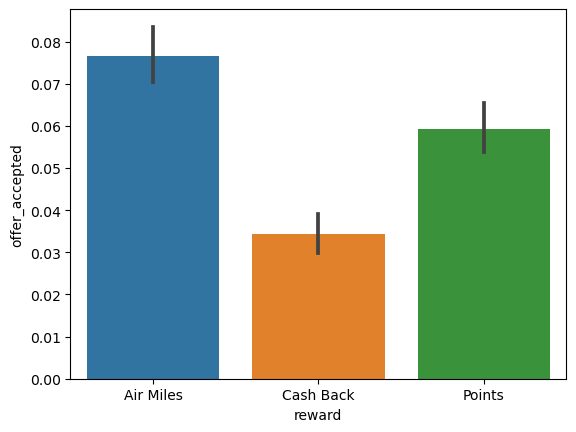

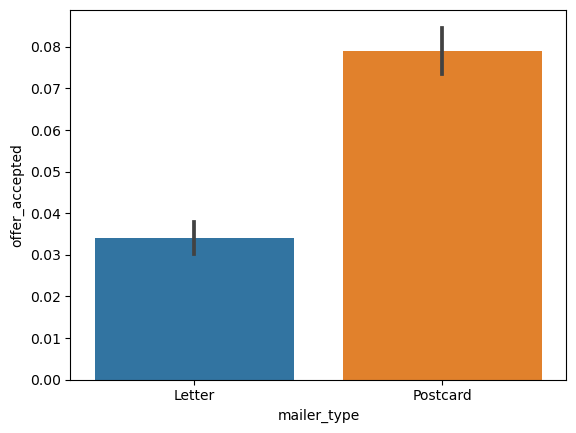

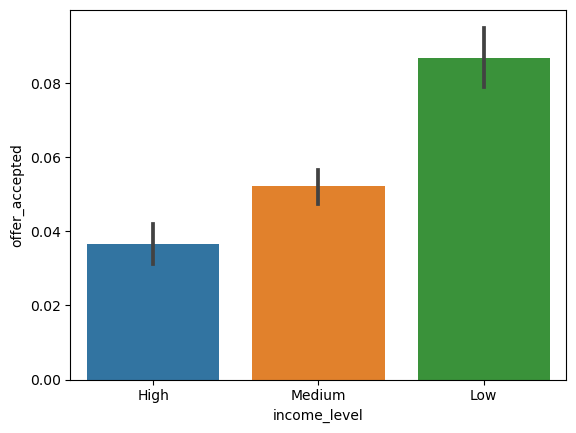

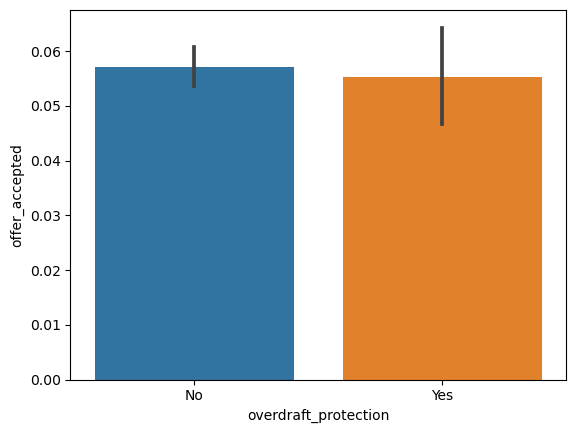

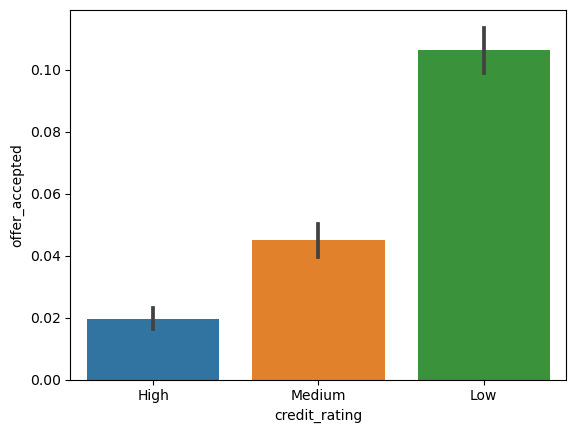

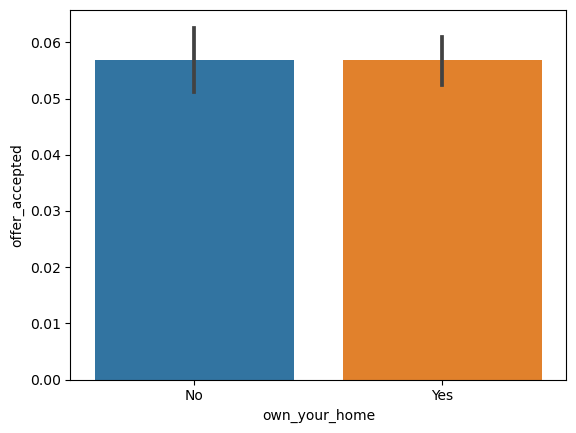

In [46]:
# Another way to look at the relative frecuencies of the accepted offer 

plotting_categoricals = categoricals.copy()
plotting_categoricals["offer_accepted"] = plotting_categoricals["offer_accepted"].apply(lambda x: 1 if x == "Yes" else 0)

for col in categoricals.drop("offer_accepted", axis=1).columns:
    sns.barplot(data=plotting_categoricals, x=col, y="offer_accepted") # compares proportion of Yes in each category
    plt.show()

**Using plots to check the correlations between the numerical independent variables and the target**

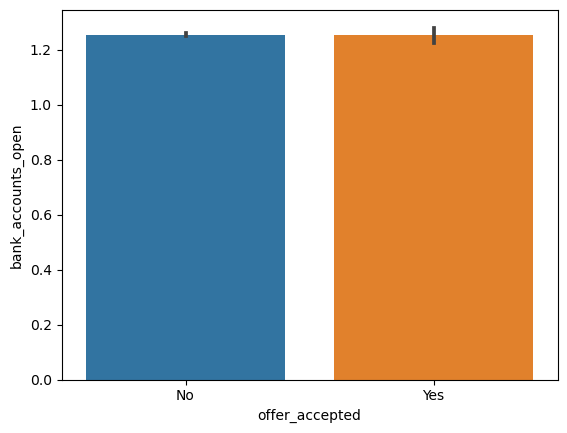

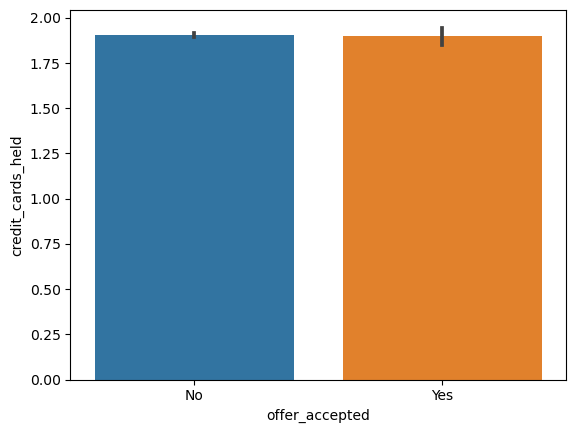

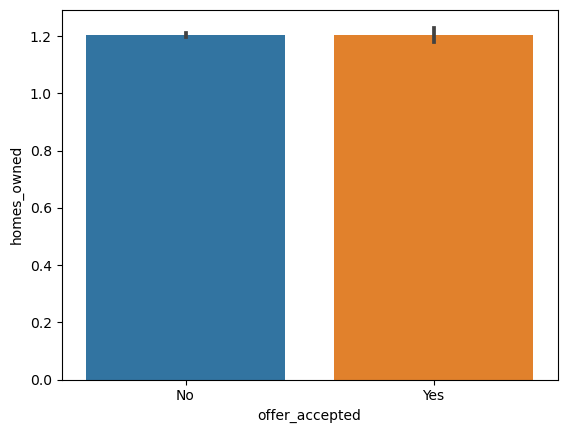

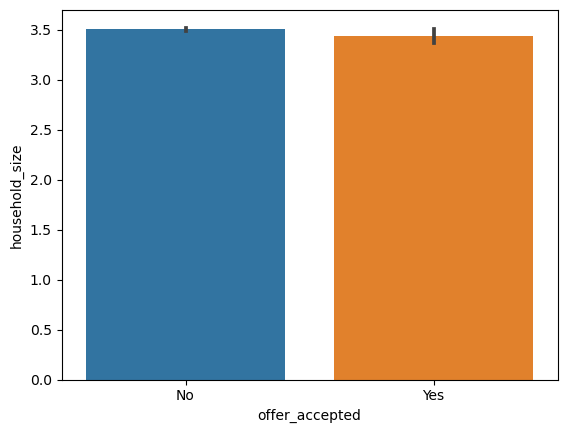

In [47]:
for col in discrete.columns:
    sns.barplot(data=data, x="offer_accepted", y=col)
    plt.show()

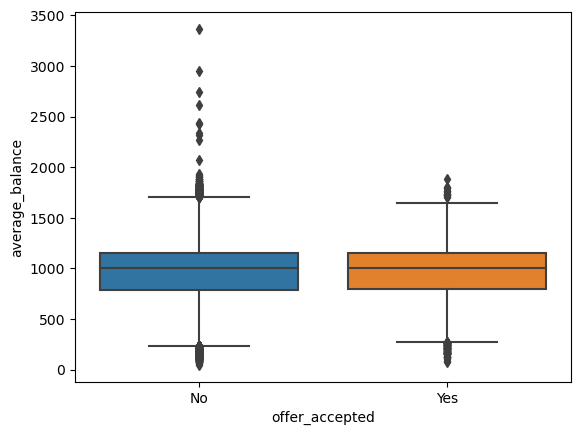

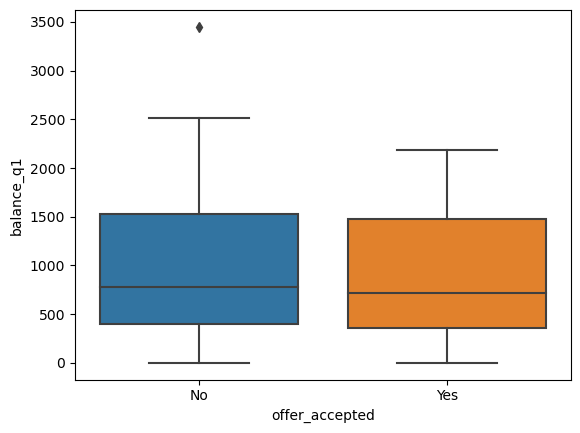

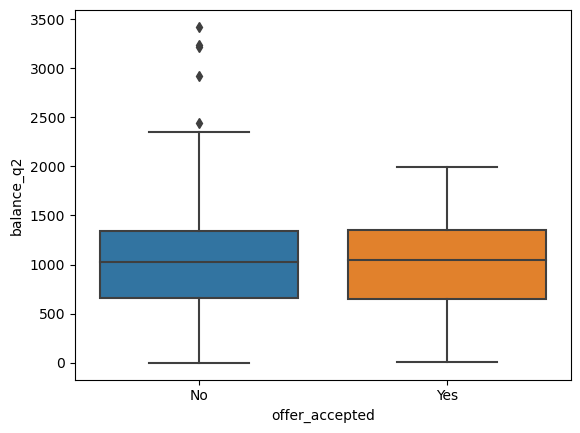

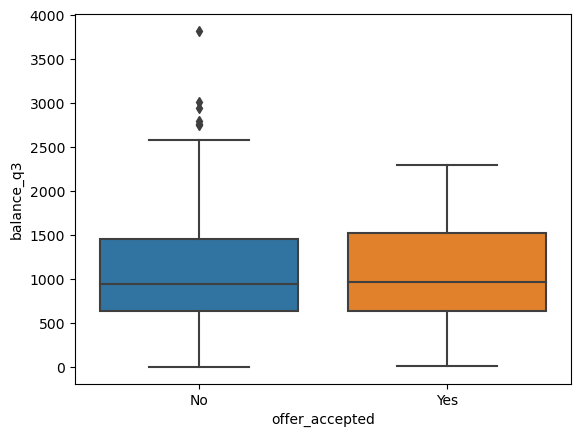

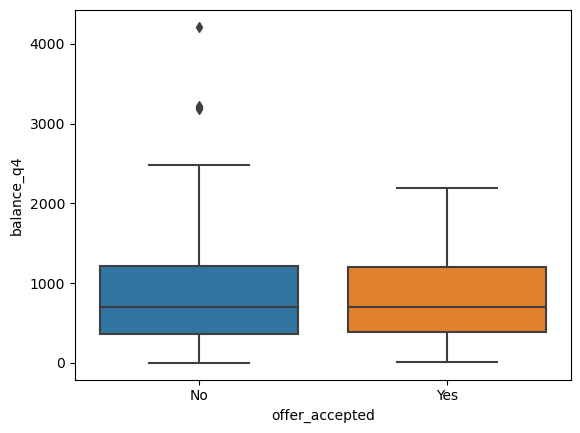

In [48]:
for col in continuous.columns:
    sns.boxplot(data=data, x="offer_accepted", y=col)
    plt.show()

The plots do not show correlations between the numerical variables and the target.

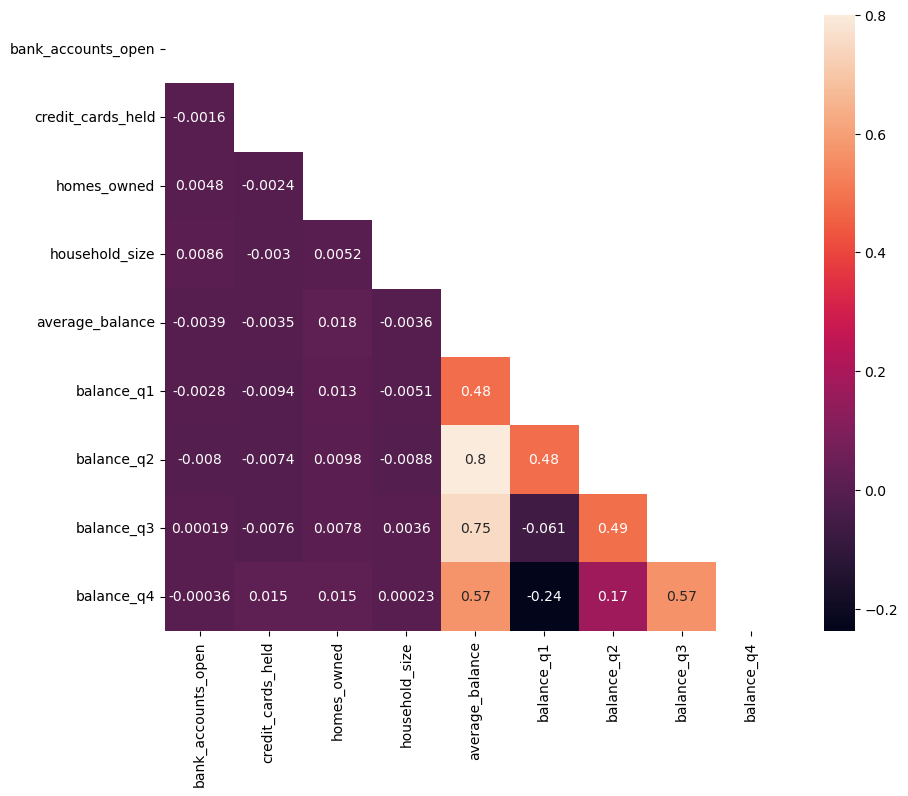

In [49]:
# HEATMAP for numerical columns to check their correlations

mask = np.zeros_like(numericals.corr())
mask[np.triu_indices_from(mask)] = True 
fig, ax = plt.subplots(figsize=(10, 8))
ax = sns.heatmap(numericals.corr(), mask=mask, annot=True)
plt.show()

**'average_balance' has a high correlation with balance_q2 and balance_q3. Therefore, these 2 columns can be dropped. Another approach can be dropping only average_balance as it has a high number of outliers too and also is correlated with balance q2 and q3. We can try this method and see if this will change the model.**

**Correlations between the categorical variables using the Chi-square method** <br>
Link to tables: https://www.medcalc.org/manual/chi-square-table.php

- **Using plots we saw that the target might be correlated with reward, mailer_type, income_level and credit_rating. Now we are going to check if those columns are actually correlated using the Chi-square method**

In [50]:
# offer_accepted (target) and reward

data_crosstab1 = pd.crosstab(data['offer_accepted'], data['reward'], margins = False)
data_crosstab1

reward,Air Miles,Cash Back,Points
offer_accepted,,,
No,5584,5789,5582
Yes,463,206,352


In [51]:
chi2, p_value, dof, expected_freq = chi2_contingency(data_crosstab1, correction=False)

print("The Chi2 value is: ",round(chi2,2))
print("The p-value is: ",p_value)
print("The number of degrees of freedom is: ",dof)
print("The expected frequencies are: ")
pd.DataFrame(expected_freq, columns=data_crosstab1.columns, index=data_crosstab1.index)

The Chi2 value is:  101.15
The p-value is:  1.0865819216542505e-22
The number of degrees of freedom is:  2
The expected frequencies are: 


reward,Air Miles,Cash Back,Points
offer_accepted,,,
No,5703.542779,5654.496273,5596.960948
Yes,343.457221,340.503727,337.039052


**With the p=0.05 and df = 2, the critical chi-square is 5.991. Therefore 96.57>5.991. Therefore, we reject the null hypothesis which means that the 2 columns are related. Considering this, we keep the 'reward' column as it's important to keep the columns related to the target.**

In [52]:
# offer_accepted and mailer_type

data_crosstab = pd.crosstab(data['offer_accepted'], data['mailer_type'])
chi2, p_value, dof, expected_freq = chi2_contingency(data_crosstab, correction=False)

print("The Chi2 value is: ",round(chi2,2))
print("The p-value is: ",p_value)
print("The number of degrees of freedom is: ",dof)

The Chi2 value is:  169.88
The p-value is:  7.864741197933402e-39
The number of degrees of freedom is:  1


The critical value of Chi2 is 3.841. <br>
169.88 > 3.841, therefore we reject the null hypothesis which means that the 2 columns are related. 

In [53]:
# offer_accepted and income_level

data_crosstab = pd.crosstab(data['offer_accepted'], data['income_level'])
chi2, p_value, dof, expected_freq = chi2_contingency(data_crosstab, correction=False)

print("The Chi2 value is: ",round(chi2,2))
print("The p-value is: ",p_value)
print("The number of degrees of freedom is: ",dof)

The Chi2 value is:  113.62
The p-value is:  2.1293673159685707e-25
The number of degrees of freedom is:  2


The critical value of Chi2 is 5.991. <br>
113.62 > 5.991, therefore we reject the null hypothesis which means that the 2 columns are related. 

In [54]:
# offer_accepted and credit_rating

data_crosstab = pd.crosstab(data['offer_accepted'], data['credit_rating'])
chi2, p_value, dof, expected_freq = chi2_contingency(data_crosstab, correction=False)

print("The Chi2 value is: ",round(chi2,2))
print("The p-value is: ",p_value)
print("The number of degrees of freedom is: ",dof)

The Chi2 value is:  445.06
The p-value is:  2.2697803189923953e-97
The number of degrees of freedom is:  2


The critical value of Chi2 is 5.991. <br>
445.06 > 5.991, therefore we reject the null hypothesis which means that the 2 columns are related. 

In [55]:
# own_your_home and overdraft_protection did not look like they were correlated with the target

# own_your_home
data_crosstab = pd.crosstab(data['offer_accepted'], data['own_your_home'])
chi2, p_value, dof, expected_freq = chi2_contingency(data_crosstab, correction=False)

print("The Chi2 value is: ",round(chi2,2))
print("The p-value is: ",p_value)
print("The number of degrees of freedom is: ",dof)

The Chi2 value is:  0.0
The p-value is:  0.9946716209502822
The number of degrees of freedom is:  1


In [56]:
# overdraft_protection
data_crosstab = pd.crosstab(data['offer_accepted'], data['overdraft_protection'])
chi2, p_value, dof, expected_freq = chi2_contingency(data_crosstab, correction=False)

print("The Chi2 value is: ",round(chi2,2))
print("The p-value is: ",p_value)
print("The number of degrees of freedom is: ",dof)

The Chi2 value is:  0.13
The p-value is:  0.7178516689441322
The number of degrees of freedom is:  1


We confirm the null hypothesis for these two variables: they are not related with the target.

- **Check correlations between other categorical columns that could be related**

In [57]:
# own_your_home and credit_rating

data_crosstab2 = pd.crosstab(data['own_your_home'], data['credit_rating'], margins = False)
data_crosstab2

credit_rating,High,Low,Medium
own_your_home,,,
No,2140,2124,2076
Yes,3924,3824,3888


In [58]:
chi2, p_value, dof, expected_freq = chi2_contingency(data_crosstab2, correction=False)

print("The Chi2 value is: ",round(chi2,2))
print("The p-value is: ",p_value)
print("The number of degrees of freedom is: ",dof)
print("The expected frequencies are: ")
pd.DataFrame(expected_freq, columns=data_crosstab2.columns, index=data_crosstab2.index)

The Chi2 value is:  1.06
The p-value is:  0.5886571581366855
The number of degrees of freedom is:  2
The expected frequencies are: 


credit_rating,High,Low,Medium
own_your_home,,,
No,2138.727192,2097.814864,2103.457944
Yes,3925.272808,3850.185136,3860.542056


**As it could be possible that the credit_rating and owning a house are related to each other, these 2 were chosen to check the correlations. However, 0.56 < 5.991 and the 2 columns are independent.**

In [59]:
# income_level and credit_rating

data_crosstab3 = pd.crosstab(data['income_level'], data['credit_rating'], margins = False)
data_crosstab3

credit_rating,High,Low,Medium
income_level,,,
High,1512,1526,1481
Low,1539,1439,1477
Medium,3013,2983,3006


In [60]:
chi2, p_value, dof, expected_freq = chi2_contingency(data_crosstab3, correction=False)

print("The Chi2 value is: ",round(chi2,2))
print("The p-value is: ",p_value)
print("The number of degrees of freedom is: ",dof)
print("The expected frequencies are: ")
pd.DataFrame(expected_freq, columns=data_crosstab3.columns, index=data_crosstab3.index)

The Chi2 value is:  2.98
The p-value is:  0.5612725847594158
The number of degrees of freedom is:  4
The expected frequencies are: 


credit_rating,High,Low,Medium
income_level,,,
High,1524.433467,1495.272141,1499.294393
Low,1502.843792,1474.095461,1478.060748
Medium,3036.722741,2978.632399,2986.644860


**1.22<9.488. Therefore, the 2 columns are independent**

In [61]:
# income_level and own_your_home

data_crosstab4 = pd.crosstab(data['income_level'], data['own_your_home'], margins = False)
data_crosstab4

own_your_home,No,Yes
income_level,,
High,1634,2885
Low,1551,2904
Medium,3155,5847


In [62]:
chi2, p_value, dof, expected_freq = chi2_contingency(data_crosstab4, correction=False)

print("The Chi2 value is: ",round(chi2,2))
print("The p-value is: ",p_value)
print("The number of degrees of freedom is: ",dof)
print("The expected frequencies are: ")
pd.DataFrame(expected_freq, columns=data_crosstab4.columns, index=data_crosstab4.index)

The Chi2 value is:  2.16
The p-value is:  0.33934930225629323
The number of degrees of freedom is:  2
The expected frequencies are: 


own_your_home,No,Yes
income_level,,
High,1593.817312,2925.182688
Low,1571.244993,2883.755007
Medium,3174.937695,5827.062305


**1.79 < 5.991. Therefore, the 2 columns are independent.**

In [63]:
# overdraft_protection and credit_rating

data_crosstab5 = pd.crosstab(data['overdraft_protection'], data['credit_rating'], margins = False)
data_crosstab5

credit_rating,High,Low,Medium
overdraft_protection,,,
No,5180,5069,5051
Yes,884,879,913


In [64]:
chi2, p_value, dof, expected_freq = chi2_contingency(data_crosstab5, correction=False)

print("The Chi2 value is: ",round(chi2,2))
print("The p-value is: ",p_value)
print("The number of degrees of freedom is: ",dof)
print("The expected frequencies are: ")
pd.DataFrame(expected_freq, columns=data_crosstab5.columns, index=data_crosstab5.index)

The Chi2 value is:  1.35
The p-value is:  0.5092903937861194
The number of degrees of freedom is:  2
The expected frequencies are: 


credit_rating,High,Low,Medium
overdraft_protection,,,
No,5161.281709,5062.550067,5076.168224
Yes,902.718291,885.449933,887.831776


**1.95<5.991 so the 2 columns are independent.**

In [65]:
#eda_report = ProfileReport(data1, title = "EDA Report - Bank Marketing")
#eda_report

# 4. Preprocessing

### Encoding categoricals

In [66]:
def encoding(df):
    enc_df = df.copy()
    
    # offer_accepted, overdraft_protection and own_your_home are boolean
    # enc_df["offer_accepted"] = enc_df["offer_accepted"].apply(lambda x: 1 if x == "Yes" else 0)
    enc_df["overdraft_protection"] = enc_df["overdraft_protection"].apply(lambda x: 1 if x == "Yes" else 0)
    enc_df["own_your_home"] = enc_df["own_your_home"].apply(lambda x: 1 if x == "Yes" else 0)

    # income_level and credit_rating are ordinal
    enc_df["income_level"] = enc_df["income_level"].map({"Low" : 0, "Medium" : 1, "High" : 2})
    enc_df["credit_rating"] = enc_df["credit_rating"].map({"Low" : 0, "Medium" : 1, "High" : 2})

    # mailer_type and reward are nominal
    enc_df = pd.get_dummies(enc_df, columns=['mailer_type', 'reward'])
    
    return enc_df

In [67]:
enc_data = encoding(data)
enc_data

,offer_accepted,income_level,bank_accounts_open,overdraft_protection,credit_rating,credit_cards_held,homes_owned,household_size,own_your_home,average_balance,balance_q1,balance_q2,balance_q3,balance_q4,mailer_type_Letter,mailer_type_Postcard,reward_Air Miles,reward_Cash Back,reward_Points
0,No,2,1,0,2,2,1,4,0,1160.75,1669.0,877.0,1095.0,1002.0,1,0,1,0,0
1,No,1,1,0,1,2,2,5,1,147.25,39.0,106.0,78.0,366.0,1,0,1,0,0
2,No,2,2,0,1,2,1,2,1,276.50,367.0,352.0,145.0,242.0,0,1,1,0,0
3,No,1,2,0,2,1,1,4,0,1219.00,1578.0,1760.0,1119.0,419.0,1,0,1,0,0
4,No,1,1,0,1,2,1,6,1,1211.00,2140.0,1357.0,982.0,365.0,1,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17995,No,2,1,0,0,1,1,5,1,167.50,136.0,65.0,71.0,398.0,1,0,0,1,0
17996,No,2,1,0,0,3,1,3,1,850.50,984.0,940.0,943.0,535.0,1,0,0,1,0
17997,No,2,1,0,0,2,1,4,0,1087.25,918.0,767.0,1170.0,1494.0,1,0,0,1,0
17998,No,1,1,0,1,4,2,2,1,1022.25,626.0,983.0,865.0,1615.0,1,0,0,1,0


### Outliers
As we have seen, there are outliers mainly in average_balance and they consist in roughly 8% of the data. There are also some outliers in the Q1, Q2, Q3 and Q4 balance columns, but in a much smaller number.

In [68]:
# Option 1: remove the outliers

data1 = data[(data['average_balance']>=239) & (data['average_balance']<=1700.75)] #removing outliers from the data
data1.shape

(16535, 16)

In [69]:
# Option 2: use higher threshold before dropping the outliers 

In [70]:
# Option 3: drop average_balance and deal only with the few outliers in Q1, Q2, Q3 and Q4 balances

data3 = data.drop("average_balance", axis=1)
data3.shape

(17976, 15)

In [71]:
# Drop outliers in Q1, Q2, Q3 and Q4 balances
# Remove the data that is above and below 1.5 times the interquartile range

for column in data3.select_dtypes(float).columns:
    upper = np.percentile(data[column], 75)
    lower = np.percentile(data[column], 25)
    iqr = upper - lower
    upper_limit = upper + 1.5 * iqr
    lower_limit = lower - 1.5 * iqr
    print(f"{column}: lower limit = {lower_limit}, upper limit = {upper_limit}")
    data3 = data3[(data3[column] >= lower_limit) & (data3[column] <= upper_limit)]
    print(data3.shape)

balance_q1: lower limit = -1299.625, upper limit = 3213.375
(17975, 15)
balance_q2: lower limit = -355.5, upper limit = 2360.5
(17971, 15)
balance_q3: lower limit = -612.0, upper limit = 2708.0
(17969, 15)
balance_q4: lower limit = -910.5, upper limit = 2485.5
(17966, 15)


### Feature selection

In [72]:
# To avoid multicolinearity between the independent features, drop balance_q3 and balance_q2 because they have the highest correlation

data1 = data1.drop(['balance_q3', 'balance_q2'], axis = 1)
data1

,offer_accepted,reward,mailer_type,income_level,bank_accounts_open,overdraft_protection,credit_rating,credit_cards_held,homes_owned,household_size,own_your_home,average_balance,balance_q1,balance_q4
0,No,Air Miles,Letter,High,1,No,High,2,1,4,No,1160.75,1669.0,1002.0
2,No,Air Miles,Postcard,High,2,No,Medium,2,1,2,Yes,276.50,367.0,242.0
3,No,Air Miles,Letter,Medium,2,No,High,1,1,4,No,1219.00,1578.0,419.0
4,No,Air Miles,Letter,Medium,1,No,Medium,2,1,6,Yes,1211.00,2140.0,365.0
5,No,Air Miles,Letter,Medium,1,No,High,3,1,4,No,1114.75,1847.0,497.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17994,No,Air Miles,Postcard,Medium,1,No,Low,2,1,2,Yes,985.25,295.0,1121.0
17996,No,Cash Back,Letter,High,1,No,Low,3,1,3,Yes,850.50,984.0,535.0
17997,No,Cash Back,Letter,High,1,No,Low,2,1,4,No,1087.25,918.0,1494.0
17998,No,Cash Back,Letter,Medium,1,No,Medium,4,2,2,Yes,1022.25,626.0,1615.0


### Normalization and transformation of numerical columns

In [73]:
numerical = data1.select_dtypes(np.number)
categorical = data1.select_dtypes(np.object)

In [74]:
#Scaling all the discrete and continous columns:
scaler = MinMaxScaler()
scaled = scaler.fit_transform(numerical)

In [75]:
#putting the array in the format of a dataframe
X_norm1 = pd.DataFrame(scaled,columns=numerical.columns, index=numerical.index)
numerical = X_norm1
numerical

,bank_accounts_open,credit_cards_held,homes_owned,household_size,average_balance,balance_q1,balance_q4
0,0.0,0.333333,0.0,0.428571,0.630580,0.758636,0.311374
2,0.5,0.333333,0.0,0.142857,0.025654,0.166818,0.075202
3,0.5,0.000000,0.0,0.428571,0.670429,0.717273,0.130205
4,0.0,0.333333,0.0,0.714286,0.664956,0.972727,0.113424
5,0.0,0.666667,0.0,0.428571,0.599111,0.839545,0.154444
...,...,...,...,...,...,...,...
17994,0.0,0.333333,0.0,0.142857,0.510518,0.134091,0.348353
17996,0.0,0.666667,0.0,0.285714,0.418334,0.447273,0.166252
17997,0.0,0.333333,0.0,0.428571,0.580298,0.417273,0.464264
17998,0.0,1.000000,0.5,0.142857,0.535830,0.284545,0.501865


In [76]:
data1.head(5)

,offer_accepted,reward,mailer_type,income_level,bank_accounts_open,overdraft_protection,credit_rating,credit_cards_held,homes_owned,household_size,own_your_home,average_balance,balance_q1,balance_q4
0,No,Air Miles,Letter,High,1,No,High,2,1,4,No,1160.75,1669.0,1002.0
2,No,Air Miles,Postcard,High,2,No,Medium,2,1,2,Yes,276.50,367.0,242.0
3,No,Air Miles,Letter,Medium,2,No,High,1,1,4,No,1219.00,1578.0,419.0
4,No,Air Miles,Letter,Medium,1,No,Medium,2,1,6,Yes,1211.00,2140.0,365.0
5,No,Air Miles,Letter,Medium,1,No,High,3,1,4,No,1114.75,1847.0,497.0


In [77]:
#taking the continous columns:
continous1 = data1.select_dtypes(float)
continous1

,average_balance,balance_q1,balance_q4
0,1160.75,1669.0,1002.0
2,276.50,367.0,242.0
3,1219.00,1578.0,419.0
4,1211.00,2140.0,365.0
5,1114.75,1847.0,497.0
...,...,...,...
17994,985.25,295.0,1121.0
17996,850.50,984.0,535.0
17997,1087.25,918.0,1494.0
17998,1022.25,626.0,1615.0


In [78]:
#Transforming the continous variables using box_cox:
df_trans = continous1.copy()

def boxcox_transform(X):
    numeric_cols = df_trans.select_dtypes(np.number).columns
    _ci = {column: None for column in numeric_cols}
    for column in numeric_cols:
        
        df_trans[column] = np.where(df_trans[column]<=0, np.NAN, df_trans[column]) 
        df_trans[column] = df_trans[column].fillna(df_trans[column].mean())
        transformed_data, ci = stats.boxcox(df_trans[column])
        df_trans[column] = transformed_data
        _ci[column] = [ci] 
    return X, _ci
continous1_transformed, _ci = boxcox_transform(df_trans)
continous1_transformed.head()

,average_balance,balance_q1,balance_q4
0,84585.376492,88.162386,58.484510
2,7580.486736,39.185544,28.097162
3,91843.811404,85.583925,37.414726
4,90832.628574,100.541004,34.831591
5,79025.666228,93.017137,40.862798


In [79]:
continous1_transformed

,average_balance,balance_q1,balance_q4
0,84585.376492,88.162386,58.484510
2,7580.486736,39.185544,28.097162
3,91843.811404,85.583925,37.414726
4,90832.628574,100.541004,34.831591
5,79025.666228,93.017137,40.862798
...,...,...,...
17994,64208.682256,34.788434,61.911495
17996,50141.798646,66.594546,42.442473
17997,75775.429673,64.174296,71.593059
17998,68314.655042,52.284589,74.461855


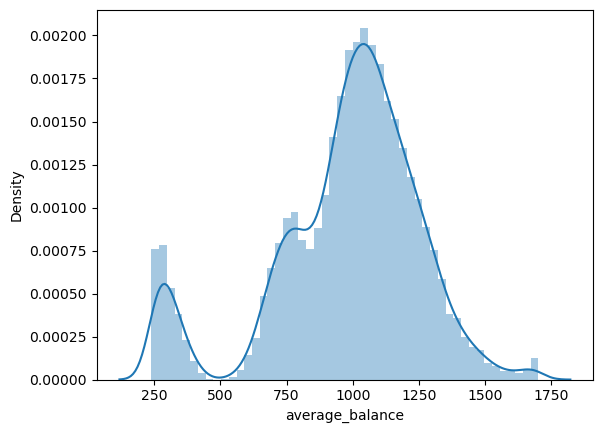

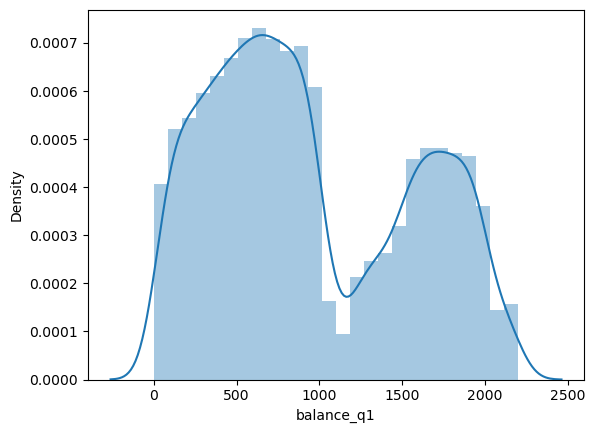

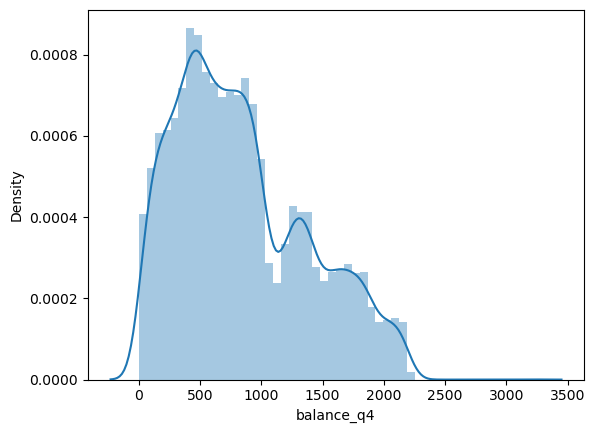

In [80]:
for i in continous1.columns:
    sns.distplot(continous1[i])
    plt.show()

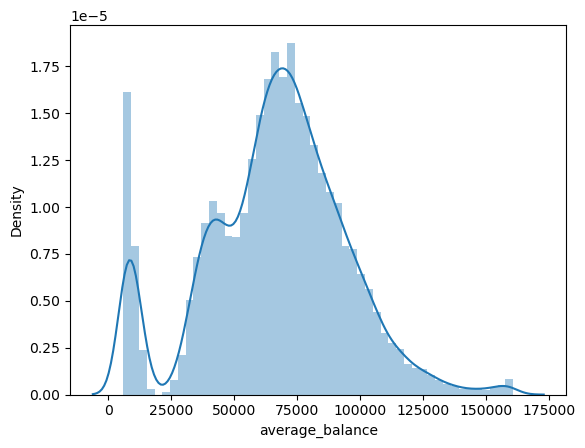

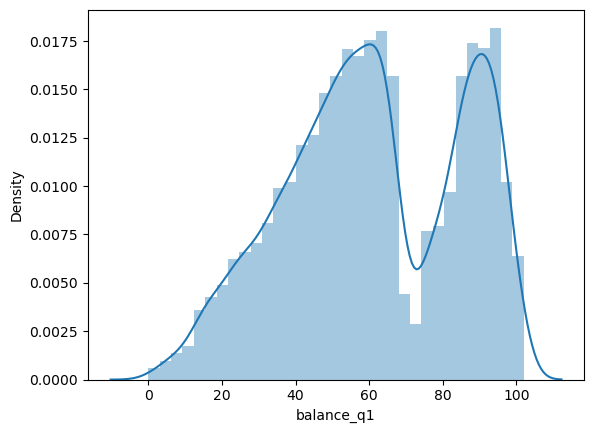

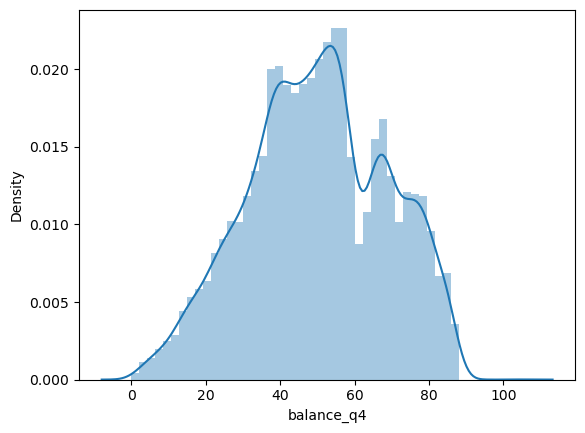

In [81]:
#Checking the distributions after transformation:
for i in continous1_transformed.columns:
    sns.distplot(continous1_transformed[i])
    plt.show()

**There is not a big improvement in the 'average_balance'. However, 'balance_q1', and 'balance_q4' got a more normal distribution. Other methods will be tried in the following.**

In [82]:
#Using log transformation
average_balance_log = np.log(continous1_transformed['average_balance'])

<AxesSubplot:xlabel='average_balance', ylabel='Density'>

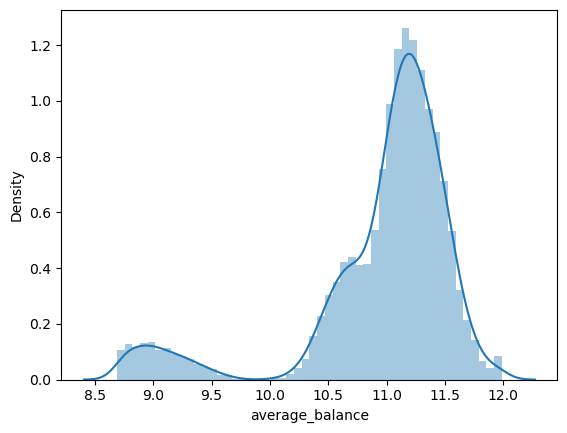

In [83]:
sns.distplot(average_balance_log)

**The average_balance column looks better with log transformation. The balance_q1&q4 don't work with log transformation as they have 0 or negative values. So, the sqrt transformation can be used as they are slightly left skewed.**

In [84]:
#Square transformation
data_log = np.sqrt(continous1_transformed['balance_q1'])

<AxesSubplot:xlabel='balance_q1', ylabel='Density'>

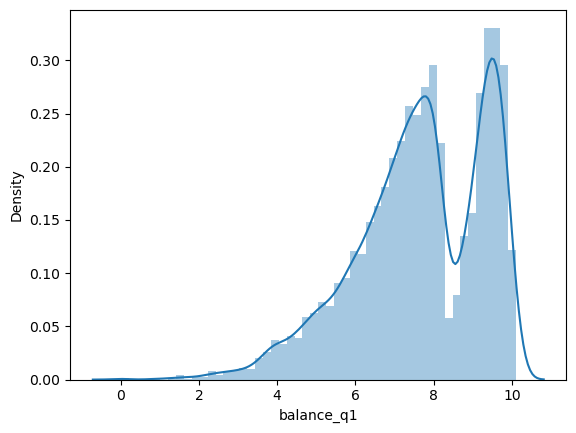

In [85]:
sns.distplot(data_log)

In [86]:
#Square transformation
data_log1 = np.sqrt(continous1_transformed['balance_q4'])

<AxesSubplot:xlabel='balance_q4', ylabel='Density'>

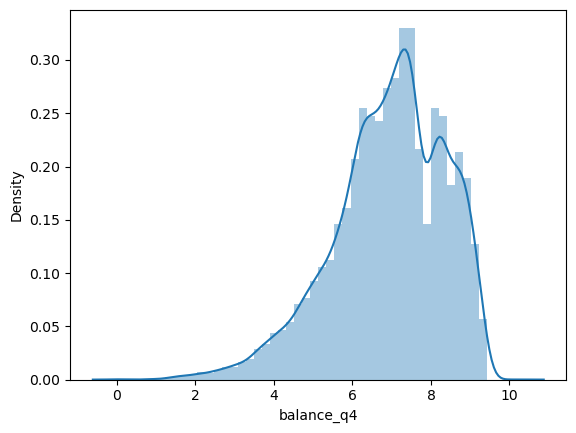

In [87]:
sns.distplot(data_log1)

**The distributions look to be closer to normal compared to before.**

**Therefore, for column 'average_balance', log transformation will be used, and for 'balance_q1' and balance_q4', square transformation will be used.**

In [88]:
#replacing the columns with transformed ones
numerical['average_balance'] = average_balance_log
numerical['balance_q1'] = data_log
numerical['balance_q4'] = data_log1

In [89]:
numerical

,bank_accounts_open,credit_cards_held,homes_owned,household_size,average_balance,balance_q1,balance_q4
0,0.0,0.333333,0.0,0.428571,11.345517,9.389483,7.647517
2,0.5,0.333333,0.0,0.142857,8.933333,6.259836,5.300676
3,0.5,0.000000,0.0,0.428571,11.427845,9.251158,6.116758
4,0.0,0.333333,0.0,0.714286,11.416774,10.027014,5.901829
5,0.0,0.666667,0.0,0.428571,11.277528,9.644539,6.392402
...,...,...,...,...,...,...,...
17994,0.0,0.333333,0.0,0.142857,11.069894,5.898172,7.868386
17996,0.0,0.666667,0.0,0.285714,10.822610,8.160548,6.514789
17997,0.0,0.333333,0.0,0.428571,11.235529,8.010886,8.461268
17998,0.0,1.000000,0.5,0.142857,11.131880,7.230808,8.629128


In [90]:
enc_cat1 = encoding(categorical)
enc_cat1

,offer_accepted,income_level,overdraft_protection,credit_rating,own_your_home,mailer_type_Letter,mailer_type_Postcard,reward_Air Miles,reward_Cash Back,reward_Points
0,No,2,0,2,0,1,0,1,0,0
2,No,2,0,1,1,0,1,1,0,0
3,No,1,0,2,0,1,0,1,0,0
4,No,1,0,1,1,1,0,1,0,0
5,No,1,0,2,0,1,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...
17994,No,1,0,0,1,0,1,1,0,0
17996,No,2,0,0,1,1,0,0,1,0
17997,No,2,0,0,0,1,0,0,1,0
17998,No,1,0,1,1,1,0,0,1,0


### Full dataframe with transformations

In [91]:
# Concatenating the final transformed numericals and encoded categoricals

data2 = pd.concat([numerical, enc_cat1], axis=1)
data2

,bank_accounts_open,credit_cards_held,homes_owned,household_size,average_balance,balance_q1,balance_q4,offer_accepted,income_level,overdraft_protection,credit_rating,own_your_home,mailer_type_Letter,mailer_type_Postcard,reward_Air Miles,reward_Cash Back,reward_Points
0,0.0,0.333333,0.0,0.428571,11.345517,9.389483,7.647517,No,2,0,2,0,1,0,1,0,0
2,0.5,0.333333,0.0,0.142857,8.933333,6.259836,5.300676,No,2,0,1,1,0,1,1,0,0
3,0.5,0.000000,0.0,0.428571,11.427845,9.251158,6.116758,No,1,0,2,0,1,0,1,0,0
4,0.0,0.333333,0.0,0.714286,11.416774,10.027014,5.901829,No,1,0,1,1,1,0,1,0,0
5,0.0,0.666667,0.0,0.428571,11.277528,9.644539,6.392402,No,1,0,2,0,1,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17994,0.0,0.333333,0.0,0.142857,11.069894,5.898172,7.868386,No,1,0,0,1,0,1,1,0,0
17996,0.0,0.666667,0.0,0.285714,10.822610,8.160548,6.514789,No,2,0,0,1,1,0,0,1,0
17997,0.0,0.333333,0.0,0.428571,11.235529,8.010886,8.461268,No,2,0,0,0,1,0,0,1,0
17998,0.0,1.000000,0.5,0.142857,11.131880,7.230808,8.629128,No,1,0,1,1,1,0,0,1,0


**Now, the logistic regression can be done. However, at the beginning, we had noticed that our target is imbalanced. Therefore, before predicting the target, we should deal with the imbalanced data.**

### Dealing with imbalanced data in the target column

In [92]:
#Splitting the X-y:

y2 = data2['offer_accepted']
X2 = data2.drop("offer_accepted", axis=1)

In [93]:
# Using Smote method(Oversampling of the minority) to have a more balanced data:
smote = SMOTE()
X2_sm, y2_sm = smote.fit_resample(X2, y2)
y2_sm.value_counts()

No     15601
Yes    15601
Name: offer_accepted, dtype: int64

# 5. Modeling

In [94]:
# Define a function to run the models

def run_model(model, X, y):
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=100)
    
    model.fit(X_train,y_train)
    predictions  = model.predict(X_test)
   
    print(classification_report(y_test, predictions))
    print("The Kappa of your model is: %4.2f" % (cohen_kappa_score(y_test, predictions)))

    return

## Logistic Regression
Applying logistic regression to predict the target

In [95]:
# Run a model with the original data to have a benchmark

y = enc_data["offer_accepted"]
X = enc_data.drop("offer_accepted", axis=1)

run_model(LogisticRegression(random_state=0), X, y)

              precision    recall  f1-score   support

          No       0.94      1.00      0.97      5093
         Yes       0.00      0.00      0.00       300

    accuracy                           0.94      5393
   macro avg       0.47      0.50      0.49      5393
weighted avg       0.89      0.94      0.92      5393

The Kappa of your model is: 0.00


Cohen's Kappa and the results for "Yes" are 0 due to imbalance.

In [96]:
# Original data + oversampling with SMOTE

X_sm, y_sm = smote.fit_resample(X, y)

run_model(LogisticRegression(random_state=0), X_sm, y_sm)

              precision    recall  f1-score   support

          No       0.86      0.83      0.85      5144
         Yes       0.83      0.86      0.85      5029

    accuracy                           0.85     10173
   macro avg       0.85      0.85      0.85     10173
weighted avg       0.85      0.85      0.85     10173

The Kappa of your model is: 0.69


In [97]:

run_model(LogisticRegression(), X_sm, y_sm)

              precision    recall  f1-score   support

          No       0.86      0.83      0.85      5144
         Yes       0.83      0.86      0.85      5029

    accuracy                           0.85     10173
   macro avg       0.85      0.85      0.85     10173
weighted avg       0.85      0.85      0.85     10173

The Kappa of your model is: 0.69


**This is going to be our benchmark**

In [98]:
# Original data + undersampling with Tomek Links

tl = TomekLinks(sampling_strategy='majority')
X_tl, y_tl = tl.fit_resample(X, y)

run_model(LogisticRegression(random_state=0), X_tl, y_tl)

              precision    recall  f1-score   support

          No       0.94      1.00      0.97      4943
         Yes       0.00      0.00      0.00       290

    accuracy                           0.94      5233
   macro avg       0.47      0.50      0.49      5233
weighted avg       0.89      0.94      0.92      5233

The Kappa of your model is: 0.00


In [99]:
y_tl.value_counts()

No     16422
Yes     1021
Name: offer_accepted, dtype: int64

In [100]:
y.value_counts()

No     16955
Yes     1021
Name: offer_accepted, dtype: int64

Tomeklink does not make the two classes equal but only removes the points from the majority class that are close to other poitns in minority class.

In [101]:
# Dataframe with all transformations, outliers removed, Q1 and Q3 balances dropped

run_model(LogisticRegression(random_state=0), X2_sm, y2_sm)

              precision    recall  f1-score   support

          No       0.80      0.73      0.76      4725
         Yes       0.74      0.81      0.78      4636

    accuracy                           0.77      9361
   macro avg       0.77      0.77      0.77      9361
weighted avg       0.77      0.77      0.77      9361

The Kappa of your model is: 0.54


The performance is worse than the benchmark.

In [102]:
# Dataframe without transformations, with outliers removed, Q1 and Q3 balances dropped

data1 = encoding(data1)

y1 = data1["offer_accepted"]
X1 = data1.drop("offer_accepted", axis=1)

X1_sm, y1_sm = smote.fit_resample(X1, y1)

run_model(LogisticRegression(random_state=0), X1_sm, y1_sm)

              precision    recall  f1-score   support

          No       0.87      0.87      0.87      4725
         Yes       0.87      0.87      0.87      4636

    accuracy                           0.87      9361
   macro avg       0.87      0.87      0.87      9361
weighted avg       0.87      0.87      0.87      9361

The Kappa of your model is: 0.74


Better performance than with transformations. Also better performance compared to benchmark.

In [103]:
# Scaling the X from the previous dataframe

X1_scaled = scaler.fit_transform(X1)
X1_scaled = pd.DataFrame(X1_scaled,columns=X1.columns, index=X1.index)

X1_scaled_sm, y1_sm = smote.fit_resample(X1_scaled, y1)

run_model(LogisticRegression(random_state=0), X1_scaled_sm, y1_sm)

              precision    recall  f1-score   support

          No       0.72      0.68      0.70      4725
         Yes       0.69      0.74      0.71      4636

    accuracy                           0.71      9361
   macro avg       0.71      0.71      0.71      9361
weighted avg       0.71      0.71      0.71      9361

The Kappa of your model is: 0.41


The performance is worse having scaled the independent variables.

In [104]:
# Scaling only the columns in X that were originally numerical

numerical.columns

Index(['bank_accounts_open', 'credit_cards_held', 'homes_owned',
       'household_size', 'average_balance', 'balance_q1', 'balance_q4'],
      dtype='object')

In [105]:
categorical.columns

Index(['offer_accepted', 'reward', 'mailer_type', 'income_level',
       'overdraft_protection', 'credit_rating', 'own_your_home'],
      dtype='object')

In [106]:
X1.columns

Index(['income_level', 'bank_accounts_open', 'overdraft_protection',
       'credit_rating', 'credit_cards_held', 'homes_owned', 'household_size',
       'own_your_home', 'average_balance', 'balance_q1', 'balance_q4',
       'mailer_type_Letter', 'mailer_type_Postcard', 'reward_Air Miles',
       'reward_Cash Back', 'reward_Points'],
      dtype='object')

In [107]:
X1_num_scaled = X1[['bank_accounts_open', 'credit_cards_held', 'homes_owned',
       'household_size', 'average_balance', 'balance_q1', 'balance_q4']]

X1_cat = X1[['mailer_type_Letter', 'mailer_type_Postcard', 'reward_Air Miles',
       'reward_Cash Back', 'reward_Points', 'income_level', 'overdraft_protection', 'credit_rating', 'own_your_home']]

scaling = scaler.fit_transform(X1_num_scaled)
X1_scaled2 = pd.DataFrame(scaling, columns=X1_num_scaled.columns, index=X1_num_scaled.index)

X1_scaled2 = pd.concat([X1_scaled2, X1_cat], axis=1)

In [108]:
X1_scaled2_sm, y1_sm = smote.fit_resample(X1_scaled2, y1)

run_model(LogisticRegression(random_state=0), X1_scaled2_sm, y1_sm)

              precision    recall  f1-score   support

          No       0.72      0.68      0.70      4725
         Yes       0.69      0.73      0.71      4636

    accuracy                           0.70      9361
   macro avg       0.70      0.70      0.70      9361
weighted avg       0.70      0.70      0.70      9361

The Kappa of your model is: 0.41


The same as scaling the full X.

In [109]:
# Dataframe without transformations, with outliers removed, Q1 and Q3 balances dropped
# Drop also the columns that are not related to target: own_your_home and overdraft_protection

y1 = data1["offer_accepted"]
X1_2 = data1.drop(["offer_accepted", "own_your_home", "overdraft_protection"], axis=1)

X1_2_sm, y1_sm = smote.fit_resample(X1_2, y1)

run_model(LogisticRegression(random_state=0), X1_2_sm, y1_sm)

              precision    recall  f1-score   support

          No       0.86      0.88      0.87      4725
         Yes       0.88      0.86      0.87      4636

    accuracy                           0.87      9361
   macro avg       0.87      0.87      0.87      9361
weighted avg       0.87      0.87      0.87      9361

The Kappa of your model is: 0.74


Better than benchmark but worse than with data1. It seems like, although we found no correlation with the target, the model is still getting useful information from these two columns.

In [110]:
# Dataframe without average_balance and more rows 

data3 = encoding(data3)
data3

,offer_accepted,income_level,bank_accounts_open,overdraft_protection,credit_rating,credit_cards_held,homes_owned,household_size,own_your_home,balance_q1,balance_q2,balance_q3,balance_q4,mailer_type_Letter,mailer_type_Postcard,reward_Air Miles,reward_Cash Back,reward_Points
0,No,2,1,0,2,2,1,4,0,1669.0,877.0,1095.0,1002.0,1,0,1,0,0
1,No,1,1,0,1,2,2,5,1,39.0,106.0,78.0,366.0,1,0,1,0,0
2,No,2,2,0,1,2,1,2,1,367.0,352.0,145.0,242.0,0,1,1,0,0
3,No,1,2,0,2,1,1,4,0,1578.0,1760.0,1119.0,419.0,1,0,1,0,0
4,No,1,1,0,1,2,1,6,1,2140.0,1357.0,982.0,365.0,1,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17995,No,2,1,0,0,1,1,5,1,136.0,65.0,71.0,398.0,1,0,0,1,0
17996,No,2,1,0,0,3,1,3,1,984.0,940.0,943.0,535.0,1,0,0,1,0
17997,No,2,1,0,0,2,1,4,0,918.0,767.0,1170.0,1494.0,1,0,0,1,0
17998,No,1,1,0,1,4,2,2,1,626.0,983.0,865.0,1615.0,1,0,0,1,0


In [111]:
y3 = data3["offer_accepted"]
X3 = data3.drop("offer_accepted", axis=1)

X3_sm, y3_sm = smote.fit_resample(X3, y3)

run_model(LogisticRegression(random_state=0), X3_sm, y3_sm)

              precision    recall  f1-score   support

          No       0.85      0.84      0.84      5110
         Yes       0.84      0.85      0.84      5057

    accuracy                           0.84     10167
   macro avg       0.84      0.84      0.84     10167
weighted avg       0.84      0.84      0.84     10167

The Kappa of your model is: 0.69


Better results so far. 

In [112]:
# Dataframe without transformations, with outliers removed, Q1, Q2, Q3 and Q4 balances dropped

y1 = data1["offer_accepted"]
X1_3 = data1.drop(["offer_accepted", "balance_q1", "balance_q4"], axis=1)

X1_3_sm, y1_sm = smote.fit_resample(X1_3, y1)

run_model(LogisticRegression(random_state=0), X1_3_sm, y1_sm)

              precision    recall  f1-score   support

          No       0.86      0.89      0.87      4725
         Yes       0.88      0.85      0.87      4636

    accuracy                           0.87      9361
   macro avg       0.87      0.87      0.87      9361
weighted avg       0.87      0.87      0.87      9361

The Kappa of your model is: 0.74


Also very good results.

**Summary: It seems that scaling and transformation of the data does not improve the final predictions of logistic regression model as the performance of the benchmark was always better. However, removing the outliers and highly correlated variables slightly improved the model.**

**Best model for logistic regression:**

In [113]:
# Dataframe without average_balance and more rows 
run_model(LogisticRegression(random_state=0), X3_sm, y3_sm)

              precision    recall  f1-score   support

          No       0.85      0.84      0.84      5110
         Yes       0.84      0.85      0.84      5057

    accuracy                           0.84     10167
   macro avg       0.84      0.84      0.84     10167
weighted avg       0.84      0.84      0.84     10167

The Kappa of your model is: 0.69


## KNN

In [114]:
# Run a model with the original data 

run_model(KNeighborsClassifier(), X, y)

              precision    recall  f1-score   support

          No       0.94      1.00      0.97      5093
         Yes       0.00      0.00      0.00       300

    accuracy                           0.94      5393
   macro avg       0.47      0.50      0.49      5393
weighted avg       0.89      0.94      0.92      5393

The Kappa of your model is: -0.00


In [115]:
# Original data + oversampling with SMOTE

run_model(KNeighborsClassifier(n_neighbors=2), X_sm, y_sm)

              precision    recall  f1-score   support

          No       0.90      0.84      0.87      5144
         Yes       0.85      0.90      0.87      5029

    accuracy                           0.87     10173
   macro avg       0.87      0.87      0.87     10173
weighted avg       0.87      0.87      0.87     10173

The Kappa of your model is: 0.74


In [116]:
run_model(KNeighborsClassifier(n_neighbors=4), X_sm, y_sm)

              precision    recall  f1-score   support

          No       0.94      0.77      0.84      5144
         Yes       0.80      0.95      0.87      5029

    accuracy                           0.86     10173
   macro avg       0.87      0.86      0.86     10173
weighted avg       0.87      0.86      0.86     10173

The Kappa of your model is: 0.71


Good results with K = 2 and K = 4, better than benchmark <br>
K = 2 gets slightly better results than the best logistic regression model

In [117]:
run_model(KNeighborsClassifier(n_neighbors=6), X_sm, y_sm)

              precision    recall  f1-score   support

          No       0.95      0.72      0.82      5144
         Yes       0.77      0.96      0.86      5029

    accuracy                           0.84     10173
   macro avg       0.86      0.84      0.84     10173
weighted avg       0.86      0.84      0.84     10173

The Kappa of your model is: 0.68


In [118]:
run_model(KNeighborsClassifier(n_neighbors=8), X_sm, y_sm)

              precision    recall  f1-score   support

          No       0.95      0.69      0.80      5144
         Yes       0.75      0.97      0.85      5029

    accuracy                           0.83     10173
   macro avg       0.85      0.83      0.82     10173
weighted avg       0.85      0.83      0.82     10173

The Kappa of your model is: 0.65


In [119]:
run_model(KNeighborsClassifier(n_neighbors=10), X_sm, y_sm)

              precision    recall  f1-score   support

          No       0.95      0.67      0.78      5144
         Yes       0.74      0.96      0.84      5029

    accuracy                           0.81     10173
   macro avg       0.84      0.81      0.81     10173
weighted avg       0.85      0.81      0.81     10173

The Kappa of your model is: 0.63


With 6, 8 and 10 neighbors we get worse results than the benchmark

In [120]:
# Dataframe with all transformations, outliers removed, Q1 and Q3 balances dropped

run_model(KNeighborsClassifier(), X2_sm, y2_sm) # default k=5

              precision    recall  f1-score   support

          No       0.97      0.76      0.85      4725
         Yes       0.80      0.98      0.88      4636

    accuracy                           0.87      9361
   macro avg       0.88      0.87      0.87      9361
weighted avg       0.89      0.87      0.87      9361

The Kappa of your model is: 0.73


Good results, better than benchmark

In [121]:
run_model(KNeighborsClassifier(n_neighbors=4), X2_sm, y2_sm)

              precision    recall  f1-score   support

          No       0.96      0.82      0.88      4725
         Yes       0.84      0.96      0.90      4636

    accuracy                           0.89      9361
   macro avg       0.90      0.89      0.89      9361
weighted avg       0.90      0.89      0.89      9361

The Kappa of your model is: 0.78


Better than the best logistic regression model

In [122]:
run_model(KNeighborsClassifier(n_neighbors=2), X2_sm, y2_sm)

              precision    recall  f1-score   support

          No       0.95      0.88      0.91      4725
         Yes       0.89      0.95      0.92      4636

    accuracy                           0.92      9361
   macro avg       0.92      0.92      0.92      9361
weighted avg       0.92      0.92      0.92      9361

The Kappa of your model is: 0.83


Best results so far.

In [123]:
# Dataframe without transformations, with outliers removed, Q1 and Q3 balances dropped
# This version was better than benchmark in LR

run_model(KNeighborsClassifier(), X1_sm, y1_sm)

              precision    recall  f1-score   support

          No       0.92      0.69      0.79      4725
         Yes       0.75      0.94      0.83      4636

    accuracy                           0.81      9361
   macro avg       0.83      0.81      0.81      9361
weighted avg       0.84      0.81      0.81      9361

The Kappa of your model is: 0.63


In [124]:
run_model(KNeighborsClassifier(n_neighbors=2), X1_sm, y1_sm)

              precision    recall  f1-score   support

          No       0.84      0.84      0.84      4725
         Yes       0.84      0.83      0.84      4636

    accuracy                           0.84      9361
   macro avg       0.84      0.84      0.84      9361
weighted avg       0.84      0.84      0.84      9361

The Kappa of your model is: 0.67


In [125]:
run_model(KNeighborsClassifier(n_neighbors=4), X1_sm, y1_sm)

              precision    recall  f1-score   support

          No       0.88      0.77      0.82      4725
         Yes       0.79      0.89      0.84      4636

    accuracy                           0.83      9361
   macro avg       0.83      0.83      0.83      9361
weighted avg       0.83      0.83      0.83      9361

The Kappa of your model is: 0.66


These are all worse than benchmark

In [126]:
# Dataframe without average_balance and more rows 
# This got the best results in LR 

run_model(KNeighborsClassifier(), X3_sm, y3_sm)

              precision    recall  f1-score   support

          No       0.96      0.69      0.81      5110
         Yes       0.76      0.97      0.85      5057

    accuracy                           0.83     10167
   macro avg       0.86      0.83      0.83     10167
weighted avg       0.86      0.83      0.83     10167

The Kappa of your model is: 0.67


In [127]:
run_model(KNeighborsClassifier(n_neighbors=2), X3_sm, y3_sm)

              precision    recall  f1-score   support

          No       0.90      0.85      0.87      5110
         Yes       0.85      0.90      0.88      5057

    accuracy                           0.87     10167
   macro avg       0.88      0.87      0.87     10167
weighted avg       0.88      0.87      0.87     10167

The Kappa of your model is: 0.75


In [128]:
run_model(KNeighborsClassifier(n_neighbors=4), X3_sm, y3_sm)

              precision    recall  f1-score   support

          No       0.94      0.78      0.85      5110
         Yes       0.81      0.95      0.87      5057

    accuracy                           0.86     10167
   macro avg       0.87      0.86      0.86     10167
weighted avg       0.87      0.86      0.86     10167

The Kappa of your model is: 0.72


Here we get similar results to the best model in logistic regression

In [129]:
# Dataframe without transformations, with outliers removed, Q1, Q2, Q3 and Q4 balances dropped

run_model(KNeighborsClassifier(n_neighbors=4), X1_3_sm, y1_sm)

              precision    recall  f1-score   support

          No       0.98      0.82      0.89      4725
         Yes       0.84      0.98      0.91      4636

    accuracy                           0.90      9361
   macro avg       0.91      0.90      0.90      9361
weighted avg       0.91      0.90      0.90      9361

The Kappa of your model is: 0.80


In [130]:
run_model(KNeighborsClassifier(n_neighbors=2), X1_3_sm, y1_sm)

              precision    recall  f1-score   support

          No       0.97      0.88      0.92      4725
         Yes       0.89      0.97      0.93      4636

    accuracy                           0.92      9361
   macro avg       0.93      0.92      0.92      9361
weighted avg       0.93      0.92      0.92      9361

The Kappa of your model is: 0.85


Best results so far

In [131]:
run_model(KNeighborsClassifier(), X1_3_sm, y1_sm)

              precision    recall  f1-score   support

          No       0.99      0.73      0.84      4725
         Yes       0.78      0.99      0.88      4636

    accuracy                           0.86      9361
   macro avg       0.89      0.86      0.86      9361
weighted avg       0.89      0.86      0.86      9361

The Kappa of your model is: 0.72


In [132]:
# Dataframe with transformations, with outliers removed, Q1, Q2, Q3 and Q4 balances dropped

X2_2 = data2.drop(["offer_accepted", "balance_q1", "balance_q4"], axis=1)
X2_2_sm, y2_sm = smote.fit_resample(X2_2, y2)

run_model(KNeighborsClassifier(n_neighbors=2), X2_2_sm, y2_sm)

              precision    recall  f1-score   support

          No       0.88      0.89      0.89      4725
         Yes       0.88      0.88      0.88      4636

    accuracy                           0.88      9361
   macro avg       0.88      0.88      0.88      9361
weighted avg       0.88      0.88      0.88      9361

The Kappa of your model is: 0.77


In [133]:
run_model(KNeighborsClassifier(n_neighbors=4), X2_2_sm, y2_sm)

              precision    recall  f1-score   support

          No       0.92      0.82      0.87      4725
         Yes       0.84      0.93      0.88      4636

    accuracy                           0.88      9361
   macro avg       0.88      0.88      0.88      9361
weighted avg       0.88      0.88      0.88      9361

The Kappa of your model is: 0.75


In [134]:
run_model(KNeighborsClassifier(), X2_2_sm, y2_sm)

              precision    recall  f1-score   support

          No       0.95      0.75      0.84      4725
         Yes       0.79      0.96      0.87      4636

    accuracy                           0.85      9361
   macro avg       0.87      0.86      0.85      9361
weighted avg       0.87      0.85      0.85      9361

The Kappa of your model is: 0.71


Similar results to the best LR model

**Best model for KNN:**

In [135]:
# Dataframe without transformations, with outliers removed, Q1, Q2, Q3 and Q4 balances dropped

run_model(KNeighborsClassifier(n_neighbors=2), X1_3_sm, y1_sm)

              precision    recall  f1-score   support

          No       0.97      0.88      0.92      4725
         Yes       0.89      0.97      0.93      4636

    accuracy                           0.92      9361
   macro avg       0.93      0.92      0.92      9361
weighted avg       0.93      0.92      0.92      9361

The Kappa of your model is: 0.85
